In [1]:
import numpy as np
import pickle
import os
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.decomposition import PCA
from scipy.special import softmax
from JADE.FastJADE import preprocess_jade_data, FastJADE
from JADE.utils import * 
from utils import *
import warnings
warnings.filterwarnings('ignore')

### **Training**

In [2]:
adata1 = ad.read_h5ad("./data/Axolotl Brain/Control_Juv.h5ad")
adata2 = ad.read_h5ad("./data/Axolotl Brain/Adult.h5ad")
adata1.obs['layer_guess_reordered'] = adata1.obs['Annotation']
adata2.obs['layer_guess_reordered'] = adata2.obs['Annotation']
# remove the scaling effect.
adata2.obsm['spatial'][:,0] = adata2.obsm['spatial'][:,0] * adata1.obsm['spatial'][:,0].mean() / adata2.obsm['spatial'][:,0].mean()
adata2.obsm['spatial'][:,1] = adata2.obsm['spatial'][:,1] * adata1.obsm['spatial'][:,1].mean() / adata2.obsm['spatial'][:,1].mean()
adata1.obs['domain'] = adata1.obs['layer_guess_reordered'].cat.codes
adata2.obs['domain'] = adata2.obs['layer_guess_reordered'].cat.codes
adata1.uns['layer_guess_reordered_colors'] = adata1.uns['Annotation_colors']
adata2.uns['layer_guess_reordered_colors'] = adata2.uns['Annotation_colors']
adata1 = add_spot_cell_assignment(adata1, 1000)
adata2 = add_spot_cell_assignment(adata2, 1000)

In [3]:
processed_data = preprocess_jade_data([adata1, adata2], verbose=False)

100%|██████████| 2/2 [00:00<00:00, 286.42it/s]


In [4]:
training_kwargs = {
    'seed': 2025,
    'pretrain_epochs': 200,
    'epochs': 800,
    'lr': 0.002,
    'weight_decay': 0.0001,
    'misalignment_weight': 0.1,
    'mismaintainness_weight': 0.2,
    'max_iter': 5,
    'n_clusters': 16,
    'verbose': False,
}

model = FastJADE(processed_data, **training_kwargs)
aligned_adatalist = model.train()

Begin to train ST data...


JADE training: 100%|██████████| 1000/1000 [14:03<00:00,  1.18it/s]

Optimization finished for ST data!


In [5]:
clustering(aligned_adatalist[0], n_clusters=17, refinement=True, radius=20, key='emb_rec',reduced_dim=20)
clustering(aligned_adatalist[1], n_clusters=16, refinement=True, radius=20, key='emb_rec',reduced_dim=20)
ARI = []
for adata in aligned_adatalist:
    ARI.append(adjusted_rand_score(adata.obs['layer_guess_reordered'], adata.obs['domain']))
print(ARI)

R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
[0.3623810646388844, 0.4836808031837465]


### **Clustering results for JADE and benchmarks**

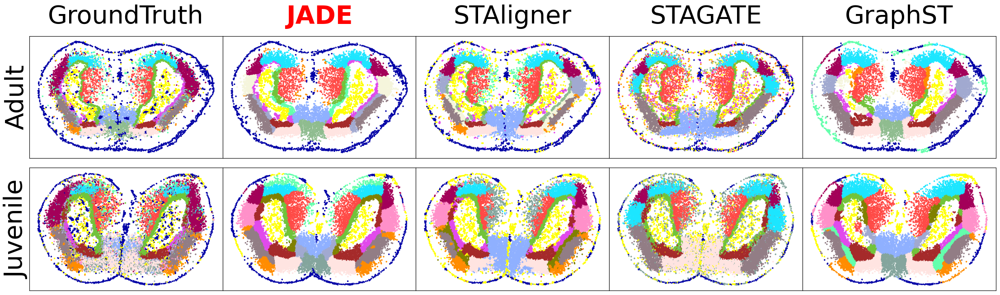

In [6]:
# === Axolotl AB — NPZ scatter that LOADS colormaps saved in GroundTruth ===
import os, numpy as np, matplotlib.pyplot as plt

# ---- paths to unified NPZs ----
paths = {
    "GroundTruth": "./cached_results/ab/groundtruth/info_juv_adult_lite.npz",  # expected to contain saved colormaps
    "JADE":        "./cached_results/ab/jade/info_juv_adult_lite.npz",
    "STAligner":   "./cached_results/ab/staligner/info_juv_adult_lite.npz",
    "STAGATE":     "./cached_results/ab/stagate/info_juv_adult_lite.npz",
    "GraphST":     "./cached_results/ab/mgraphst/info_juv_adult_lite.npz",
}
method_names = [m for m in ["GroundTruth","JADE","STAligner","STAGATE","GraphST"] if os.path.exists(paths[m])]

# ---- helpers ----
def load_gt_cmaps(gt_npz_path: str):
    """Return (cmap_juv, cmap_adult) dicts if present in GroundTruth NPZ; else (None, None)."""
    if not os.path.exists(gt_npz_path):
        return None, None
    z = np.load(gt_npz_path, allow_pickle=True)
    cj = ca = None
    if "juv_cmap_keys" in z and "juv_cmap_vals" in z:
        keys, vals = list(z["juv_cmap_keys"]), list(z["juv_cmap_vals"])
        cj = {str(k): str(v) for k, v in zip(keys, vals)}
    if "adult_cmap_keys" in z and "adult_cmap_vals" in z:
        keys, vals = list(z["adult_cmap_keys"]), list(z["adult_cmap_vals"])
        ca = {str(k): str(v) for k, v in zip(keys, vals)}
    return cj, ca

def load_slices(npz_path: str):
    """Read per-slice spatial + inferred_label (fallback to domain) from a unified NPZ."""
    z = np.load(npz_path, allow_pickle=True)
    names = list(z["slice_names"])                     # e.g., ["Juvenile","Adult"]
    L = int(z["ad_lengths"].shape[0])
    sl = []
    for i in range(L):
        spatial = z[f"ad_{i}_spatial"]
        labels  = z.get(f"ad_{i}_inferred_label", None)
        if labels is None:
            labels = z[f"ad_{i}_domain"].astype(str)
        sl.append({"name": names[i], "spatial": spatial, "labels": np.asarray(labels, dtype=object)})
    return sl

def row_of(name: str, fallback: int):
    """Adult on top (row=0), Juvenile bottom (row=1); fallback keeps input order."""
    s = str(name).lower()
    if "adult" in s: return 0
    if "juvenile" in s: return 1
    return fallback

# ---- load everything ----
data = {m: load_slices(paths[m]) for m in method_names}
gt_path = paths.get("GroundTruth", "")
cmap_juv_saved, cmap_adult_saved = load_gt_cmaps(gt_path)

# If GT didn’t carry colormaps, fall back to simple deterministic palettes
def _build_palette(labels, cycle):
    labs = list(np.unique(labels))
    return {lab: cycle[i % len(cycle)] for i, lab in enumerate(labs)}

default_cycle_juv   = ["#1f77b4","#ff7f0e","#2ca02c","#d62728","#9467bd",
                       "#8c564b","#e377c2","#7f7f7f","#bcbd22","#17becf"]
default_cycle_adult = ["#56B4D3","#A3E4D7","#F49097","#F7D86A","#FFA473",
                       "#D4A5A5","#A29BFE","#BDBDBD","#8DD3C7","#FB8072"]

# Build palettes per row (merge across methods so colors are consistent)
all_labels = {0: [], 1: []}
for m in method_names:
    for i, sl in enumerate(data[m]):
        all_labels[row_of(sl["name"], i)].extend(sl["labels"])

cmap_juv   = cmap_juv_saved   if cmap_juv_saved   else _build_palette(all_labels[1], default_cycle_juv)
cmap_adult = cmap_adult_saved if cmap_adult_saved else _build_palette(all_labels[0], default_cycle_adult)

# ---- plot ----
fig, axes = plt.subplots(2, len(method_names), figsize=(23, 6.5),
                         gridspec_kw=dict(left=0.05, right=0.98, bottom=0.00, top=0.90, wspace=0.0, hspace=0.0))
if len(method_names) == 1:
    axes = np.vstack([axes])  # make (2,1) indexable

for col, method in enumerate(method_names):
    for i, sl in enumerate(data[method]):
        row = row_of(sl["name"], i)
        ax  = axes[row, col]
        palette = cmap_adult if row == 0 else cmap_juv
        colors  = [palette.get(lbl, "#cccccc") for lbl in sl["labels"]]
        XY      = sl["spatial"]
        ax.scatter(XY[:, 0], XY[:, 1], s=25, marker='.', linewidths=0, c=colors)
        ax.invert_yaxis()
        ax.set_aspect('equal', adjustable='box')
        ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
        if row == 0:
            title_kw = {"fontsize": 40, "pad": 20}
            if method in ("JADE","JADE-Fast"):
                title_kw.update(fontweight="bold", color="red")
            ax.set_title(method, **title_kw)

axes[0, 0].set_ylabel("Adult",    rotation=90, fontsize=40, labelpad=20, va='center')
axes[1, 0].set_ylabel("Juvenile", rotation=90, fontsize=40, labelpad=20, va='center')
# plt.savefig("./fig/ab/cluster_all.pdf", dpi=300, bbox_inches="tight")
plt.show()


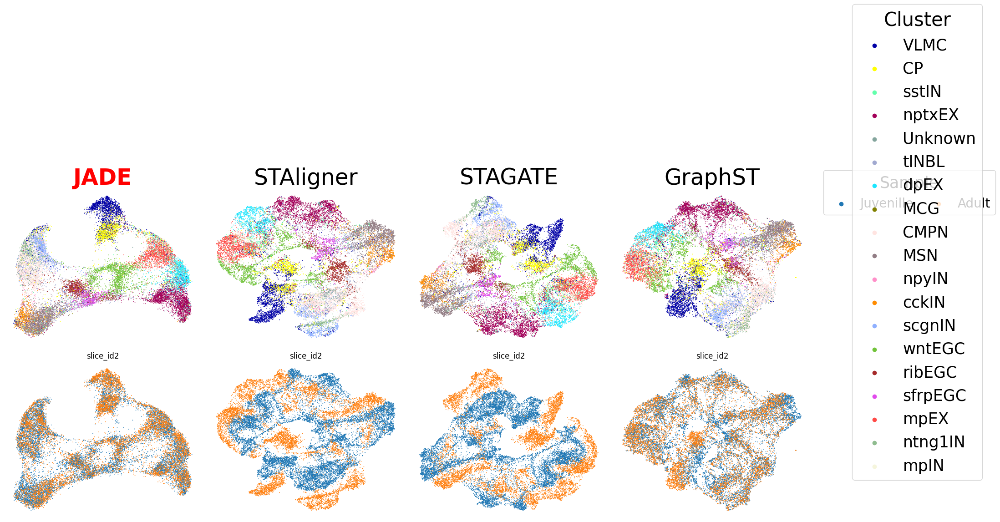

In [7]:
panel_paths = {
    "JADE":      "./cached_results/ab/jade/info_juv_adult_lite.npz",
    "STAligner": "./cached_results/ab/staligner/info_juv_adult_lite.npz",
    "STAGATE":   "./cached_results/ab/stagate/info_juv_adult_lite.npz",
    "GraphST":   "./cached_results/ab/mgraphst/info_juv_adult_lite.npz",
}
panel_order = [n for n in ["JADE","STAligner","STAGATE","GraphST"] if os.path.exists(panel_paths[n])]
if not panel_order: raise FileNotFoundError("No NPZ files found under ./cached_results/ab/*/info_juv_adult_lite.npz")

ilisi_titles = {
    "JADE":      "iLISI: 1.85",
    "GraphST":   "iLISI: 1.78",
    "STAligner": "iLISI: 1.25",
    "STAGATE":   "iLISI: 1.23",
}
pal_file = "./cached_results/ab/groundtruth/palettes.npz"

# helpers
def _dec(codes, cats):
    a, b = np.asarray(codes, int), np.asarray(cats, object)
    out  = np.where(a >= 0, b[a], "unknown")
    return pd.Categorical(out, categories=list(pd.unique(out)))

def load_adata(p):
    z = np.load(p, allow_pickle=True)
    obs = pd.DataFrame({
        "slice_id2": _dec(z["combined_slice_codes"], z["combined_slice_cats"]),
        "layer_guess_reordered": _dec(z["combined_layer_codes"], z["combined_layer_cats"]),
    }, index=z["combined_index"])
    A = ad.AnnData(X=np.empty((obs.shape[0],0), np.float32), obs=obs)
    A.obsm["X_umap"] = z["combined_umap"].astype(np.float32)
    A.obsm["emb"]    = z["combined_emb"].astype(np.float32)
    return A

def load_pals(p):
    if not os.path.exists(p): return {}, {}
    z = np.load(p, allow_pickle=True)
    to_dict = lambda k,v: ({str(a): str(b) for a,b in zip(z[k], z[v])} if k in z and v in z else {})
    return to_dict("combined_cmap_keys","combined_cmap_vals"), to_dict("sample_cmap_keys","sample_cmap_vals")

# data & palettes
adatas = {n: load_adata(panel_paths[n]) for n in panel_order}
cmap, smap = load_pals(pal_file)
cmap.setdefault("unknown", "#BDBDBD")
fallback = ["#F7D86A","#D4A5A5","#A29BFE","#F49097","#FFA473","#A3E4D7","#56B4D3","#7f7f7f","#bcbd22","#17becf"]
cats = []
for A in adatas.values(): cats += list(map(str, A.obs["layer_guess_reordered"].cat.categories))
for i,c in enumerate(pd.unique(cats)): cmap.setdefault(c, fallback[i % len(fallback)])

# plot
fig, axes = plt.subplots(2, len(panel_order), figsize=(20,8))
for j, name in enumerate(panel_order):
    A = adatas[name]
    # sample row
    ax = axes[1, j]
    pal_s = {c: smap.get(str(c), "#BDBDBD") for c in A.obs["slice_id2"].cat.categories} if smap else None
    sc.pl.umap(A, color="slice_id2", palette=pal_s, na_color="#BDBDBD", na_in_legend=False, ax=ax, show=False)
    t = ilisi_titles.get(name, "")
    kw = {"fontsize": 30}
    if "1.85" in t: kw.update(fontweight="bold", color="red")
    # ax.set_title(t, **kw) if t else ax.set_title("")
    ax.axis("off")
    # cluster row
    ax = axes[0, j]
    pal_c = {c: cmap.get(str(c), "#BDBDBD") for c in A.obs["layer_guess_reordered"].cat.categories}
    sc.pl.umap(A, color="layer_guess_reordered", palette=pal_c, na_color="#BDBDBD", na_in_legend=False, ax=ax, show=False)
    kw = {"fontsize": 35}
    if name.startswith("JADE"): kw.update(fontweight="bold", color="red")
    ax.set_title(name, **kw); ax.axis("off")

# legends (shared)
get_hl = lambda ax: ([], []) if getattr(ax, "legend_", None) is None else ax.get_legend_handles_labels()
hs, ls = get_hl(axes[1,0]); hc, lc = get_hl(axes[0,0])
for ax in axes.ravel():
    if getattr(ax, "legend_", None) is not None: ax.legend_.remove()
if hs:
    fig.legend(hs, ls, title="Sample", loc="upper left", bbox_to_anchor=(0.9, 0.99),
               ncol=2, fontsize=20, title_fontsize=25, columnspacing=1.0, handletextpad=0.5)
if hc:
    fig.legend(hc, lc, title="Cluster", loc="lower left", bbox_to_anchor=(0.93, 0.10),
               ncol=1, fontsize=25, title_fontsize=30)

plt.tight_layout(rect=[0,0,0.9,1]); plt.show()


In [8]:
npz_paths = {
    "JADE":      "./cached_results/ab/jade/info_juv_adult_lite.npz",
    "mGraphST":  "./cached_results/ab/mgraphst/info_juv_adult_lite.npz",
    "STAligner": "./cached_results/ab/staligner/info_juv_adult_lite.npz",
    "STAGATE":   "./cached_results/ab/stagate/info_juv_adult_lite.npz",
}
n_pcs, k_lisi = 20, 100

def load_emb_and_nA(p):
    z = np.load(p, allow_pickle=True)
    emb = z["combined_emb"].astype(np.float32)
    nA  = int(z["ad_lengths"][0]) if "ad_lengths" in z else len(z["ad_0_obs"])
    return emb, nA

for name, path in npz_paths.items():
    if not os.path.exists(path): 
        continue
    emb, nA = load_emb_and_nA(path)
    batch = np.r_[np.zeros(nA, int), np.ones(emb.shape[0]-nA, int)]
    ncomp = min(n_pcs, emb.shape[1], emb.shape[0])
    emb_pca = PCA(n_components=ncomp, random_state=0).fit_transform(emb)
    print(f"{name:10s} mean iLISI = {compute_iLISI(emb_pca, batch, k=k_lisi).mean():.3f}")


JADE       mean iLISI = 1.848
mGraphST   mean iLISI = 1.784
STAligner  mean iLISI = 1.249
STAGATE    mean iLISI = 1.234


### **Differential expression analysis**

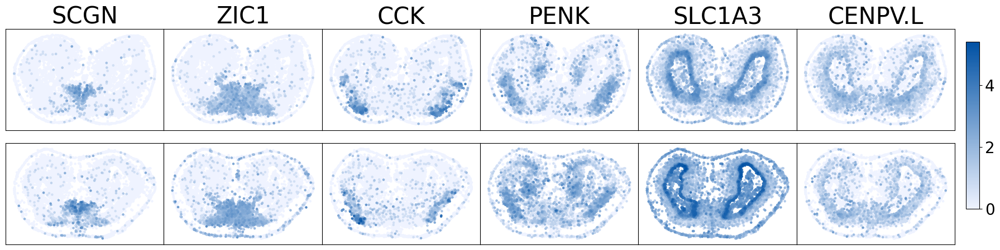

In [9]:
# NOTE: Plot marker genes
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.colors as mc, colorsys
import matplotlib.colorbar as cb
def increase_saturation(hex_color, factor):
    # hex → RGB [0–1]
    r, g, b = mcolors.hex2color(hex_color)
    # → H, L, S
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    # boost saturation
    s = min(1.0, s * factor)
    # back to RGB
    r2, g2, b2 = colorsys.hls_to_rgb(h, l, s)
    return (r2, g2, b2)
orig = ["#eff3ff", "#08519c"]
sat_colors = [increase_saturation(c, 5.0) for c in orig]
blue2light = LinearSegmentedColormap.from_list("blue2light", sat_colors)
markers = ['SCGN | AMEX60DD038981', 'ZIC1 | AMEX60DD001970', 'CCK | AMEX60DD022038', 'PENK | AMEX60DD039745', 'SLC1A3 | AMEX60DD041912', 'CENPV.L[nr]|CENPV[hs] | AMEX60DD054765']
markers_short = ['SCGN', 'ZIC1', 'CCK', 'PENK', 'SLC1A3', 'CENPV.L']
fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(20, 5))
vmin = np.inf
vmax = -np.inf
# Get global vmin/vmax
for adata_expr in [adata1.raw if adata1.raw is not None else adata1,
                   adata2.raw if adata2.raw is not None else adata2]:
    for marker in markers:
        vals = adata_expr[:, marker].X
        if hasattr(vals, "toarray"):  # handle sparse matrix
            vals = vals.toarray()
        vmin = min(vmin, np.min(vals))
        vmax = max(vmax, np.max(vals))
# Plot for both datasets
for i, adata in enumerate([adata1, adata2]):
    adata_expr = adata.raw if adata.raw is not None else adata
    for k, (marker, marker_short) in enumerate(zip(markers,markers_short)):
        sc.pl.spatial(
            adata,
            color=marker,
            spot_size=120,
            cmap=blue2light,
            ax=axes[i, k],
            title='',
            show=False,
            colorbar_loc=None,
            vmin=vmin,
            vmax=vmax
        )
        axes[i, k].set_xlabel('')
        axes[i, k].set_ylabel('')
        if i == 0:
            axes[i, k].set_title(marker_short, fontsize=30)
            
# Adjust spacing (more compact)
fig.subplots_adjust(
    left=0.03, right=0.88, top=0.92, bottom=0.1,
    wspace=0.0, hspace=0.00  # smaller spacing
)
# Shared colorbar
cmap = plt.get_cmap(blue2light)
norm = plt.Normalize(vmin=vmin, vmax=vmax)
# Tighter colorbar
cbar_ax = fig.add_axes([0.89, 0.25, 0.012, 0.6])
cb1 = cb.ColorbarBase(cbar_ax, cmap=cmap, norm=norm)
cbar_ax.tick_params(labelsize=20) 
# Save & show
# plt.savefig("./fig/ab/marker_genes.png")
plt.show()


### **Alignment**

In [10]:
from scipy.io import mmread

pi_jade = np.load("./cached_results/ab/jade/juv_adult_spot_align.npy")
pi_staligner = np.load("./cached_results/ab/staligner/juv_adult_spot_align.npy")
pi_seurat = mmread("./cached_results/ab/seurat/juv_adult_spot_align.mtx").toarray()
pi_paste = np.load("./cached_results/ab/paste/juv_adult_spot_align.npy")

100%|██████████| 14/14 [00:30<00:00,  2.21s/it]


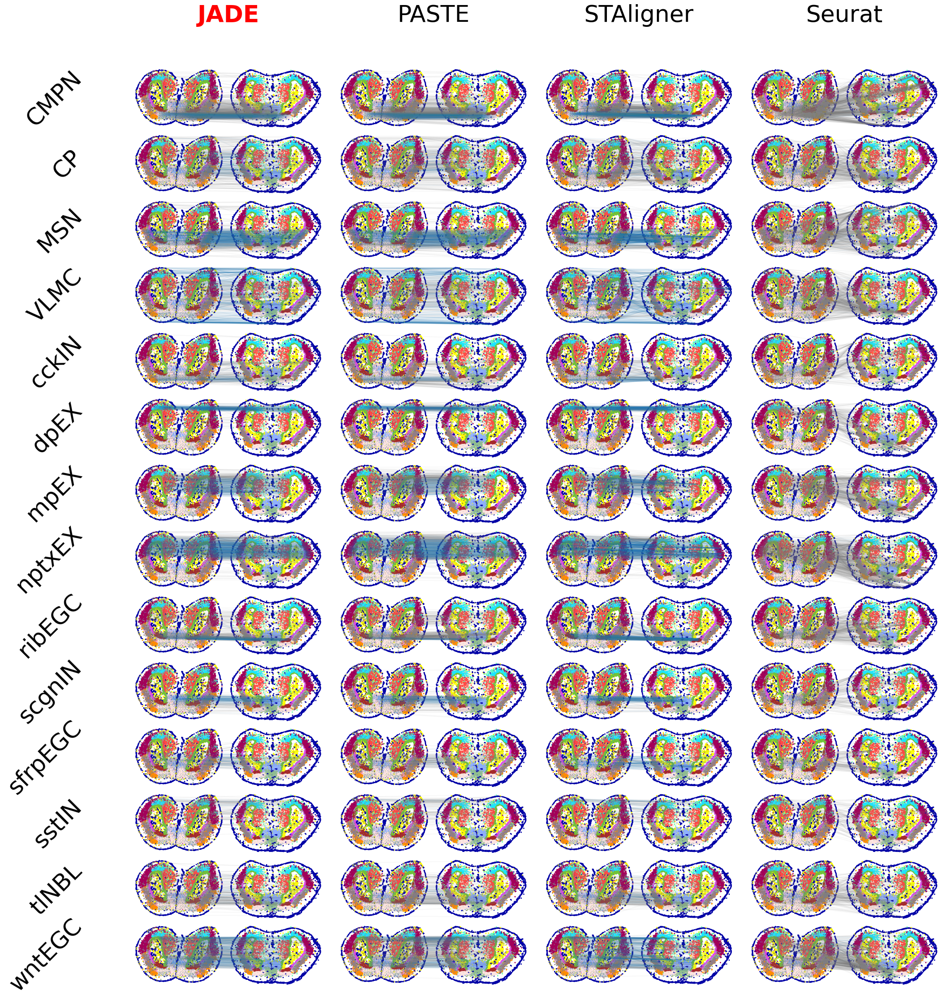

In [11]:
import os, numpy as np, pandas as pd, anndata as ad, matplotlib.pyplot as plt
from scipy import sparse
from tqdm import tqdm

GT_NPZ      = "./cached_results/ab/groundtruth/info_juv_adult_lite.npz"
PALETTE_NPZ = "./cached_results/ab/groundtruth/palettes.npz"
JADE_NPZ    = "./cached_results/ab/jade/info_juv_adult_lite.npz"

def ls(p,i):
    z = np.load(p, allow_pickle=True)
    on = z[f"ad_{i}_obs"]; vn = z.get(f"ad_{i}_var", np.array([],object))
    fmt = str(z.get(f"ad_{i}_X_fmt", np.array(["dense"],object))[0])
    X = sparse.csr_matrix((z[f"ad_{i}_X_data"], z[f"ad_{i}_X_indices"], z[f"ad_{i}_X_indptr"]),
                          shape=tuple(z[f"ad_{i}_X_shape"])) if fmt=="csr" else z[f"ad_{i}_X_dense"]
    lab = (z[f"ad_{i}_inferred_label"] if f"ad_{i}_inferred_label" in z.files else z[f"ad_{i}_domain"]).astype(str)
    cat = pd.Categorical(lab, categories=list(pd.unique(lab)))
    A = ad.AnnData(X=X, obs=pd.DataFrame({"Annotation":cat,"layer_guess_reordered":cat}, index=on),
                   var=pd.DataFrame(index=vn))
    A.obsm["spatial"] = z[f"ad_{i}_spatial"]; A.obs["inferred_label"] = A.obs["Annotation"]
    if os.path.exists(PALETTE_NPZ):
        zp = np.load(PALETTE_NPZ, allow_pickle=True); pref = "juv" if i==0 else "adult"
        k1,k2=f"{pref}_cmap_keys",f"{pref}_cmap_vals"
        if k1 in zp.files and k2 in zp.files:
            cmap = {str(a):str(b) for a,b in zip(zp[k1],zp[k2])}
            cats = list(A.obs["layer_guess_reordered"].cat.categories)
            A.uns["layer_guess_reordered_colors"] = [cmap.get(c,"#CCC") for c in cats]
    return A

def load_cmap():
    if not os.path.exists(PALETTE_NPZ): return {}
    z = np.load(PALETTE_NPZ, allow_pickle=True)
    if "combined_cmap_keys" in z.files and "combined_cmap_vals" in z.files:
        return {str(a):str(b) for a,b in zip(z["combined_cmap_keys"], z["combined_cmap_vals"])}
    pal={}
    for pre in ("juv","adult"):
        k1,k2=f"{pre}_cmap_keys",f"{pre}_cmap_vals"
        if k1 in z.files and k2 in z.files: pal.update({str(a):str(b) for a,b in zip(z[k1],z[k2])})
    return pal

def top_idx(a,k):
    if k<=0 or a.size==0: return np.array([],int),np.array([],int)
    k=min(k,a.size); flat=np.argpartition(a.ravel(),-k)[-k:]
    i,j=np.unravel_index(flat,a.shape); o=np.argsort(-a[i,j],kind="mergesort"); return i[o],j[o]

if "col_normalize" not in globals():
    def col_normalize(M): S=M.sum(0,keepdims=True); S[S==0]=1.; return M/S

def load_align(p):
    if not os.path.exists(p): return None
    z=np.load(p, allow_pickle=True)
    if "alignments" in z.files: return z["alignments"]
    ks=[k for k in z.files if k.startswith("align_")]
    return z[ks[0]] if ks else None

A1, A2 = ls(GT_NPZ,0), ls(GT_NPZ,1)
cmap = load_cmap(); cmap.setdefault("unknown","#CCC")

def plot_ax(ax, A1, A2, pi, cmap, k1="layer_guess_reordered", k2="layer_guess_reordered",
            top=1000, alpha=0.05, walpha=False, cluster=None):
    import matplotlib.colors as mcolors, colorsys
    def ds(c,f=0.6):
        r,g,b=mcolors.to_rgb(c); h,l,s=colorsys.rgb_to_hls(r,g,b)
        r2,g2,b2=colorsys.hls_to_rgb(h,l,s*f); return mcolors.to_hex((r2,g2,b2))
    c1,c2=A1.obsm["spatial"],A2.obsm["spatial"]; off=(c1[:,0].max()-c2[:,0].min())*1.1; c2o=c2+np.array([off,0.])
    l1=A1.obs[k1].astype(str).to_numpy(); l2=A2.obs[k2].astype(str).to_numpy()
    M=pi.copy()
    if cluster is not None:
        m=(l1==str(cluster)); M[~m,:]=-1
    i,j=top_idx(M,int(top))
    mx=float(pi[m,:].max()) if pi.size and cluster is not None and m.any() else (float(pi.max()) if pi.size else 1.)
    for a,b in zip(i,j):
        ok=(l1[a]==l2[b]); col=ds("#1f77b4",1.0) if ok else ds("#808080",0.6)
        alp=alpha*(1-walpha)+(walpha*(pi[a,b]/mx if mx>0 else 0.))
        ax.plot([c1[a,0],c2o[b,0]],[c1[a,1],c2o[b,1]], color=col, alpha=alp, lw=1.5)
    col1=pd.Series(A1.obs.get("inferred_label",A1.obs[k1]).astype(str)).map(cmap).fillna("#ccc").to_numpy(object)
    col2=pd.Series(A2.obs.get("inferred_label",A2.obs[k2]).astype(str)).map(cmap).fillna("#ccc").to_numpy(object)
    ax.scatter(c1[:,0],c1[:,1],s=20,marker='.',color=col1,linewidths=0)
    ax.scatter(c2o[:,0],c2o[:,1],s=20,marker='.',color=col2,linewidths=0)
    ax.invert_yaxis(); ax.axis("off")

clist = sorted(set(map(str,A1.obs["Annotation"].cat.categories))
               & set(map(str,A2.obs["Annotation"].cat.categories)))

pJ = load_align(JADE_NPZ) if "pi_jade" not in globals() else pi_jade
if pJ is None and "pi_jade" not in globals():
    raise RuntimeError("Need pi_jade in scope or JADE_NPZ alignments.")
methods = [col_normalize(pJ),                  # JADE
           pi_paste,                           # PASTE
           col_normalize(pi_staligner),        # STAligner
           col_normalize(pi_seurat)]           # Seurat
titles  = ["JADE","PASTE","STAligner","Seurat"]

fig, axes = plt.subplots(len(clist), len(methods), figsize=(24,24), squeeze=False)
for i, cl in tqdm(list(enumerate(clist))):
    m=(A1.obs["layer_guess_reordered"].astype(str).to_numpy()==cl)
    topk=max(1,int(m.sum()//2))
    for j, M in enumerate(methods):
        ax=axes[i,j]; plot_ax(ax,A1,A2,M,cmap,top=topk,cluster=cl)
        ax.set_xticks([]); ax.set_yticks([])

plt.tight_layout(h_pad=0.5, w_pad=0.5); fig.subplots_adjust(left=0.18, top=0.92)
for j,t in enumerate(titles):
    pos=axes[0,j].get_position(); x=pos.x0+pos.width/2
    kw={"fontsize":40}; 
    if t=="JADE": kw.update(color="red", fontweight="bold")
    plt.gcf().text(x,0.96,t,ha="center",va="bottom",**kw)
for i,cl in enumerate(clist):
    pos=axes[i,0].get_position()
    plt.gcf().text(pos.x0-0.04, pos.y0+pos.height/2, cl, ha="right", va="center", rotation=45, fontsize=40)

# plt.savefig("fig/supp/align_all_ab_npz.png", dpi=150, bbox_inches="tight")
plt.show()
